# Visualize NSD images (cropped cocodataset) based on VGG16 Convolutional layer features

## In this notebook, I am going to show you 

* How to extract the features for a set of images at a certain layer of VGG16 pretrained model with PyTorch.
* How to use PCA(Principle component analysis) to reduce the feature dimension for better visualization.
* How to use t-SNE to visualize the image set based on their similarity of layer features (visualize the n-dimension features as 2-d distance).

In [1]:
from pathlib import Path
import h5py
from torchvision import models
from PIL import Image
from torchvision import transforms
import numpy as np

### Read in the image
NSD images are square-cropped images from Microsoft Coco dataset

In [2]:
# import stimuli
sti_dir = Path('/projects/hulacon/shared/nsd/nsddata_stimuli/stimuli/nsd/nsd_stimuli.hdf5').as_posix()
sti = h5py.File(sti_dir,'r')
sti_array = sti['imgBrick']

### Read in the pretrianed VGG16 model


In [3]:
# import model
pretrained_model = models.vgg16(pretrained=True).features
pretrained_model.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

Above we can see the convolutional layer structure of VGG. The index of each layer is labeled. I will use the pooling layer 1 as the example.

In [5]:
conv_layer = {
    'conv1': 0,
    'conv2': 2,
    'conv3': 5,
    'conv4': 7,
    'conv5': 10,
    'conv6': 12,
    'conv7': 14,
    'conv8': 17,
    'conv9': 19,
    'conv10': 21,
    'conv11': 24,
    'conv12': 26,
    'conv13': 28}

pooling_layer = {
    'pool1': 4,
    'pool2': 9,
    'pool3': 16,
    'pool4': 23,
    'pool5': 30}

selected_layer = pooling_layer['pool1']

In [6]:
selected_layer

4

### Image preprocessing
Here, we define the function that can normailize the input images.

In [7]:
# define preprocess parameters
# mini-batches of 3-channel RGB images of shape (3 x H x W)
preprocess = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def image_preprocess(img):
    """
    Preprocess the image and create the tensor
    """
    im = Image.fromarray(img)
    input_tensor = preprocess(im) # create tensor
    input_batch = input_tensor.unsqueeze(0)# create a mini-batch as expected by the model
    return input_batch

### Feature extraction
Here, we define the function that can extract features at a centain layer

In [11]:
def feature_extract(tensor, selected_layer):
    for index,layer in enumerate(pretrained_model):
#         print(index, layer)
        tensor = layer(tensor)
        if (index == selected_layer):
            return tensor

### Read in and preprocess pictures
We are going to use 200 pictures from the stimuli set as an example. We flatten all the feature for each image in order to calculate distance between image features/ use t-SNE

In [22]:
features = []
pic_number = 200
for iImage in range(pic_number):
    img = sti_array[iImage,:,:,:]
    input_batch = image_preprocess(img)
    current_features = np.squeeze(feature_extract(input_batch, selected_layer).data.numpy())
#     print(current_features.shape)
    features.append(np.concatenate(current_features, axis=None))


In [23]:
features = np.array(features)
features.shape

(200, 802816)

Since we are using the pooling layer, the feature numbers aren't crazily large. We can skip the following steps for PCA. 
If you are extracting features from convolutional layers, PCA would be very helpful.

In [14]:
# from sklearn.decomposition import PCA

# 
# pca = PCA(n_components=1000)
# pca.fit(features)

In [15]:
# pca_features = pca.transform(features)

### t-SNE visualization
Here, we are just using some default hyperparameters for t-SNE for a simple visualization. You can try to tune the hyperparameters if you like.

In [26]:
from sklearn.manifold import TSNE
images = sti_array[0:pic_number,:,:,:]
features = np.array(features)
tsne = TSNE(n_components=2, learning_rate=150, perplexity=30, angle=0.2, verbose=2).fit_transform(features)
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 200 samples in 4.441s...
[t-SNE] Computed neighbors for 200 samples in 45.717s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 321.907110
[t-SNE] Computed conditional probabilities in 0.021s
[t-SNE] Iteration 50: error = 110.1199646, gradient norm = 0.3914785 (50 iterations in 0.065s)
[t-SNE] Iteration 100: error = 119.6677475, gradient norm = 0.2513522 (50 iterations in 0.065s)
[t-SNE] Iteration 150: error = 120.5060120, gradient norm = 0.2420261 (50 iterations in 0.063s)
[t-SNE] Iteration 200: error = 117.5590820, gradient norm = 0.4199304 (50 iterations in 0.063s)
[t-SNE] Iteration 250: error = 122.9965286, gradient norm = 0.2279717 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 122.996529
[t-SNE] Iteration 300: error = 2.4189911, gradient norm = 0.0285375 (50 iterations in 0.060s)
[t-SNE] Iteration 350: error = 1.8055801, gradient norm = 0.

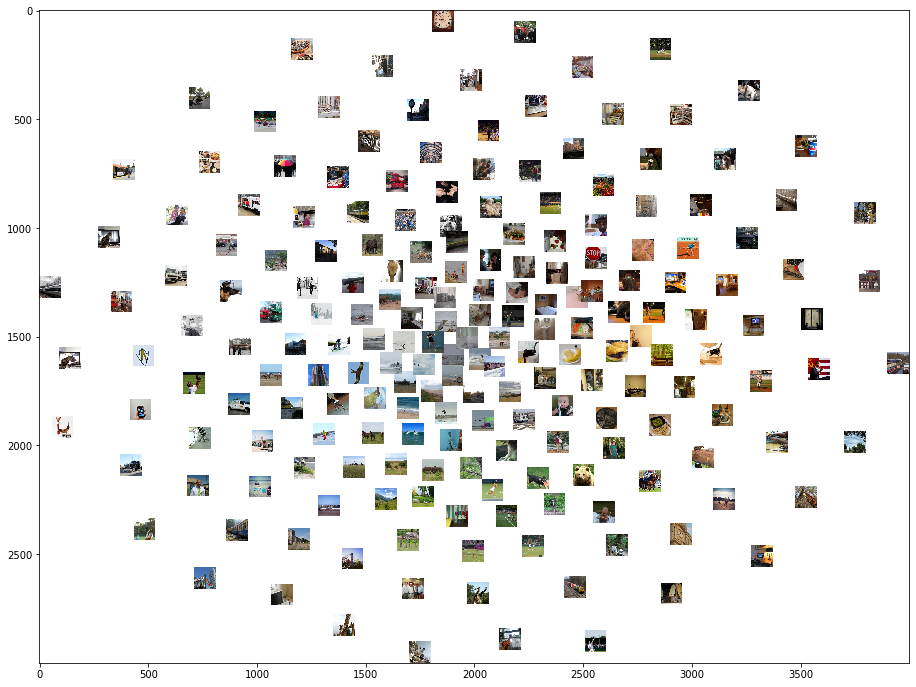

In [27]:
from matplotlib.pyplot import imshow
import matplotlib
width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(images, tx, ty):
    tile = Image.fromarray(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

matplotlib.pyplot.figure(figsize = (16,12))
imshow(full_image)

You can see clear color and shape clusters in the visualization. This makes sense since the pooling layer 1 is at a very early stage, which caputres relatively low level features of the images.

In below, the visulation based on pooling layer 5 is presented.
You can clearly see some semantic category clusters, like bears and bananas.

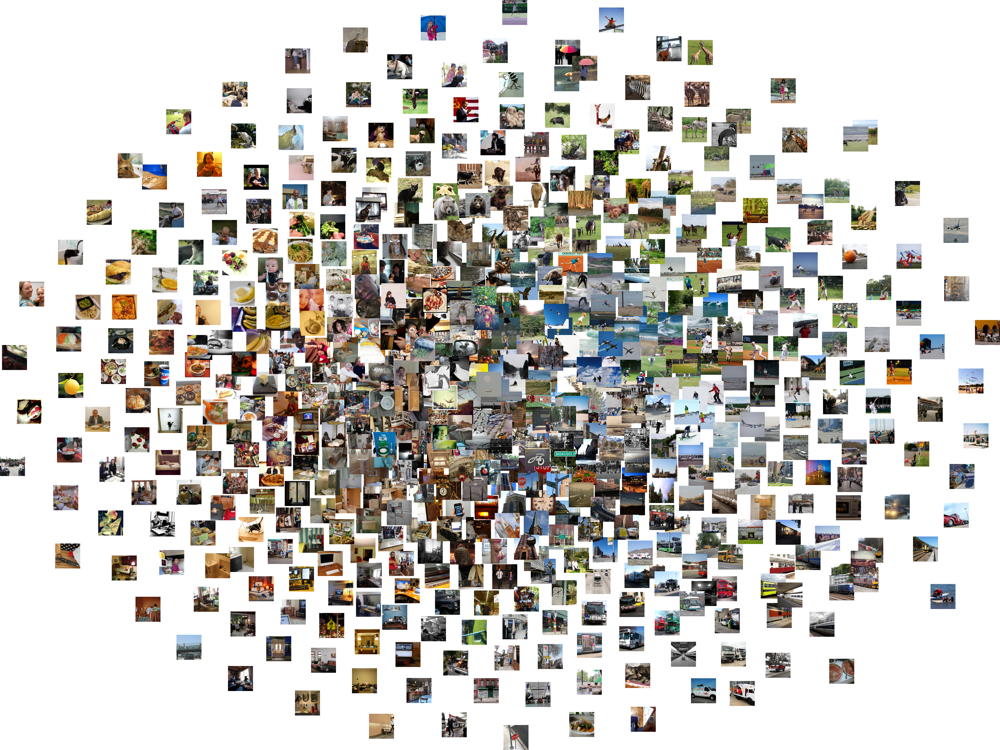

In [31]:
Image(filename='samples/pool5_600pics_try2.png') 

### Reference
1. https://github.com/utkuozbulak/pytorch-cnn-visualizations
2. https://nextjournal.com/ml4a/image-t-sne
